# Perch V2 — Zero-Shot vs Trained Classifier Evaluation

### Data format expected
- **WAV folder**: flat folder of `.wav` files named like `SCW1807_20200711_082500.wav`
- **Annotation JSON**: single JSON file mapping `SCW1807_20200711_082500-contours.json` → list of `{start, end, label}` dicts

### What this notebook does

1. Extracts **fixed 5s windows** and associates the corresponding labels
2. Embeds all windows with **Perch V2**
3. Evaluates **zero-shot** performance using Perch V2's built-in logits
4. Trains a **linear classifier** on top of the embeddings
5. Reports **per-class precision / recall / F1** for both, with plots
6. Performs **Dimensinality Reduction** to asses class separation in 2D and cluster formation.


> **Requirements**: GPU runtime + perch-hoplite installed (cells below)

In order to use Perch V2, you must install this version (or later) of TensorFlow and cuda

In [ ]:
%pip install tensorflow[and-cuda]~=2.20.0rc0

Choose the working gpu

In [1]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "0"

In [2]:
import tensorflow as tf
import torch

print(f"TF GPUs: {tf.config.list_physical_devices('GPU')}")
print(f"PyTorch: {torch.cuda.get_device_name(0) if torch.cuda.is_available() else 'CPU'}")
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    # Only use GPU 0
    tf.config.set_visible_devices(gpus[0], 'GPU')
    # Optional: prevent TF from grabbing all memory
    tf.config.experimental.set_memory_growth(gpus[0], True)
print(f"TF using: {tf.config.get_visible_devices('GPU')}")

2026-05-05 12:38:31.189503: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2026-05-05 12:38:31.239912: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2026-05-05 12:38:32.595631: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.


TF GPUs: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
PyTorch: NVIDIA L4
TF using: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [3]:
#@title Imports
import json
import warnings
from pathlib import Path
import os
import librosa
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import tensorflow as tf
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (
    classification_report
)
import librosa.display
import soxr
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import LabelEncoder, StandardScaler
from perch_hoplite.zoo import model_configs

In [4]:
#@title Configuration { vertical-output: true }

#@markdown Folder containing all .wav files
wav_folder = '/data2/mromaniuc/cet-det/datasets/DRYAD/Audio'  #@param {type:'string'}

#@markdown Folder for base saving
save_dir = '/data2/mromaniuc/cet-det/models/perch_v2/DRYAD'

#@markdown Path to your single annotation JSON file
annotation_json_path = '/data2/mromaniuc/cet-det/datasets/DRYAD/all_annotations.json'  #@param {type:'string'}

#@markdown Window size in seconds fed to Perch V2 (default 5.0)
window_size_s = 5.0  #@param {type:'number'}

#@markdown Minimum overlap (s) between an annotation and a window to label it as positive
min_overlap_s = 0.001  #@param {type:'number'}

#@markdown Fraction of data held out for testing
test_size = 0.3  #@param {type:'number'}

#@markdown Random seed
random_seed = 123  #@param {type:'number'}

In [5]:
#@title Load Perch V2 model
model_key = 'perch_v2'
embedding_model = model_configs.load_model_by_name(model_key)
sr = embedding_model.sample_rate

perch_class_names = list(embedding_model.class_list['labels'].classes)
print(f'Model loaded. Sample rate: {sr} Hz')
print(f'Perch V2 built-in classes: {len(perch_class_names)}')

I0000 00:00:1777977518.947133  858604 gpu_device.cc:2020] Created device /device:GPU:0 with 20749 MB memory:  -> device: 0, name: NVIDIA L4, pci bus id: 0000:3b:00.0, compute capability: 8.9
I0000 00:00:1777977519.351957  858604 gpu_device.cc:2020] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 20749 MB memory:  -> device: 0, name: NVIDIA L4, pci bus id: 0000:3b:00.0, compute capability: 8.9


Model loaded. Sample rate: 32000 Hz
Perch V2 built-in classes: 14795


In [6]:
#@title Parse annotations and build window list (DRYAD)

from pathlib import Path
from collections import defaultdict

with open(annotation_json_path) as f:
    annot = json.load(f)

wav_folder = Path(wav_folder)

# Build a lookup: audio_file_stem -> subdataset (for path resolution)
# and group annotations by (audio_file, subdataset)
file_annotations = defaultdict(list)
file_subdataset = {}
for ann in annot['annotations']:
    key = ann['audio_file']
    file_annotations[key].append(ann)
    file_subdataset[key] = ann['subdataset']

# Find WAV files by searching subdirectories
def find_wav(wav_folder, audio_file, subdataset):
    """Try subdataset subfolder first, then fallback to recursive search."""
    candidate = wav_folder / subdataset / audio_file
    if candidate.exists():
        return candidate
    # Fallback: recursive search
    matches = list(wav_folder.rglob(audio_file))
    return matches[0] if matches else None

windows = []
missing_wavs = []

for audio_file, annotations in file_annotations.items():
    subdataset = file_subdataset[audio_file]
    wav_path = find_wav(wav_folder, audio_file, subdataset)

    if wav_path is None:
        missing_wavs.append(audio_file)
        continue

    duration = librosa.get_duration(path=str(wav_path))
    n_windows = int(duration // window_size_s)

    # Grab the split from the first annotation (consistent per file)
    file_split = annotations[0]['split']  # 'train' or 'test'

    for i in range(n_windows):
        win_start = i * window_size_s
        win_end = win_start + window_size_s

        n_whistle = 0
        n_bout = 0
        n_noise = 0

        for ann in annotations:
            overlap = min(win_end, ann['end']) - max(win_start, ann['start'])
            if overlap >= min_overlap_s:
                lbl = ann['label']
                if lbl == 'Whistle':
                    n_whistle += 1
                elif lbl == 'Bout':
                    n_bout += 1
                elif lbl == 'Noise':
                    n_noise += 1

        # Build compound label
        present = []
        if n_whistle > 0: present.append('whistle')
        if n_bout > 0: present.append('bout')
        label = '+'.join(sorted(present)) if present else 'background'

        windows.append({
            'wav_path': str(wav_path),
            'offset_s': win_start,
            'label': label,
            'subdataset': subdataset,
            'split': file_split,
            'n_whistle': n_whistle,
            'n_bout': n_bout,
            'n_noise': n_noise,
        })

windows_df = pd.DataFrame(windows)

print(f'Total windows: {len(windows_df)}')
print(f'Files processed: {len(file_annotations) - len(missing_wavs)} / {len(file_annotations)}')
if missing_wavs:
    print(f'WARNING: {len(missing_wavs)} WAV files not found: {missing_wavs[:10]}')

print('\n=== Label distribution ===')
print(windows_df['label'].value_counts().to_string())

print('\n=== Split distribution ===')
print(windows_df['split'].value_counts().to_string())

print('\n=== Per subdataset ===')
print(windows_df.groupby(['subdataset', 'label']).size().to_string())

print('\n=== Per-type stats ===')
for col, name in [('n_whistle', 'Whistle'), ('n_bout', 'Bout'), ('n_noise', 'Noise')]:
    has = windows_df[windows_df[col] > 0]
    if len(has):
        print(f'  {name}: {len(has)} windows, mean={has[col].mean():.1f}, max={has[col].max()}')
    else:
        print(f'  {name}: 0 windows')

Total windows: 6770
Files processed: 60 / 60

=== Label distribution ===
label
background      3854
whistle         2133
bout+whistle     641
bout             142

=== Split distribution ===
split
train    5848
test      922

=== Per subdataset ===
subdataset     label       
IMMS           background      2056
               bout              21
               bout+whistle      99
               whistle          666
Oceanographic  background      1645
               bout              35
               bout+whistle     171
               whistle         1035
SWFSC          background       153
               bout              86
               bout+whistle     371
               whistle          432

=== Per-type stats ===
  Whistle: 2774 windows, mean=2.2, max=11
  Bout: 783 windows, mean=1.6, max=6
  Noise: 7 windows, mean=1.0, max=1


just to check wether we correctly assigned the labels:

In [7]:
#@title Visualize window labels — all files in one plot (DRYAD)

from matplotlib.patches import Patch

label_colors = {
    'background':   '#d3d3d3',
    'whistle':      '#e67e22',
    'bout':         '#4682b4',
    'bout+whistle': '#8e44ad',
}

ann_colors = {
    'Whistle': '#2ecc71',
    'Bout':    '#3498db',
    'Noise':   '#999999',
}

# Build per-file annotation lookup from the flat list
file_ann_lookup = defaultdict(list)
for a in annot['annotations']:
    file_ann_lookup[a['audio_file']].append(a)

files = windows_df['wav_path'].unique()
n_files = len(files)

fig, axes = plt.subplots(n_files, 1, figsize=(15, 2.5 * n_files))
if n_files == 1:
    axes = [axes]

for ax, wav_path in zip(axes, files):
    file_windows = windows_df[windows_df['wav_path'] == wav_path]
    duration = file_windows['offset_s'].max() + window_size_s
    audio_file = Path(wav_path).name          # e.g. "IMMS_Combined_Test.wav"
    file_anns  = file_ann_lookup[audio_file]

    # Draw window labels
    for _, row in file_windows.iterrows():
        color = label_colors.get(row['label'], 'gray')
        ax.barh(0, window_size_s, left=row['offset_s'], height=0.5,
                color=color, edgecolor='white', linewidth=0.3)

    # Overlay raw annotations
    for a in file_anns:
        color = ann_colors.get(a['label'], '#999999')
        ax.barh(0.6, a['end'] - a['start'], left=a['start'],
                height=0.2, color=color, alpha=0.7)

    # Shade test vs train regions (file-level split)
    split = file_windows['split'].iloc[0]
    if split == 'test':
        ax.axhspan(-0.3, 0.9, alpha=0.06, color='red')

    ax.set_xlim(0, duration)
    ax.set_yticks([0, 0.6])
    ax.set_yticklabels(['windows', 'annotations'], fontsize=6)
    ax.set_xlabel('Time (s)', fontsize=6)
    ax.set_title(
        f'{audio_file}  [{file_windows["subdataset"].iloc[0]} | {split}]'
        f'  ({len(file_windows)} win)',
        fontsize=7
    )
    ax.tick_params(axis='x', labelsize=6)

# Legend
legend_elements = [
    Patch(facecolor=v, label=k) for k, v in label_colors.items()
] + [
    Patch(facecolor='#2ecc71', label='raw Whistle'),
    Patch(facecolor='#3498db', label='raw Bout'),
    Patch(facecolor='#999999', label='raw Noise'),
    Patch(facecolor='red', alpha=0.15, label='test file'),
]
axes[0].legend(handles=legend_elements, loc='upper right', fontsize=5, ncol=4)

plt.suptitle(
    f'DRYAD — {n_files} files, {len(windows_df)} windows  '
    f'(train={len(windows_df[windows_df.split=="train"])}, '
    f'test={len(windows_df[windows_df.split=="test"])})',
    fontsize=10
)
plt.tight_layout()

import os
os.makedirs(f'{save_dir}/figures', exist_ok=True)
plt.savefig(f'{save_dir}/figures/visualize_windows.png', dpi=100, bbox_inches='tight')
plt.close()
print(f'Saved — {n_files} files in one plot')

Saved — 58 files in one plot


~45 minutes to run for 3290 samples of 5s resampled from 512khz

In [8]:
import soxr
from tqdm import tqdm

embeddings_list, logits_list, labels_list, failed_idx = [], [], [], []
windows_df = windows_df.reset_index(drop=True)

for i, row in tqdm(windows_df.iterrows(), total=len(windows_df)):
    try:
        audio_native, native_sr = librosa.load(
            row['wav_path'], sr=None,
            offset=row['offset_s'], duration=window_size_s, mono=True
        )
        audio = soxr.resample(audio_native, native_sr, sr)
        target_len = int(window_size_s * sr)
        if len(audio) < target_len:
            audio = np.pad(audio, (0, target_len - len(audio)))
        audio = audio[:target_len].astype(np.float32)

        out = embedding_model.embed(audio)
        embeddings_list.append(out.embeddings[0].mean(axis=0))
        logits_list.append(out.logits['label'][0])
        labels_list.append(row['label'])
    except Exception as e:
        failed_idx.append(i)
        print(f'  FAILED [{i}] {Path(row["wav_path"]).name} @ {row["offset_s"]:.1f}s — {repr(e)}')
    if (i + 1) % 100 == 0:
        print(f'  {i+1}/{len(windows_df)} embedded...')

X = np.stack(embeddings_list)
Z = np.stack(logits_list)
y = np.array(labels_list)

print(f'\nDone. {len(X)} embedded, {len(failed_idx)} failed.')
print(f'Embedding shape: {X.shape}')

  0%|          | 0/6770 [00:00<?, ?it/s]2026-04-22 15:39:57.920889: I external/local_xla/xla/service/service.cc:163] XLA service 0x7fedcc06dca0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2026-04-22 15:39:57.920912: I external/local_xla/xla/service/service.cc:171]   StreamExecutor device (0): NVIDIA L4, Compute Capability 8.9
2026-04-22 15:39:58.259335: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2026-04-22 15:39:58.305234: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:473] Loaded cuDNN version 92100
2026-04-22 15:39:59.201206: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_55', 68 bytes spill stores, 68 bytes spill loads

2026-04-22 15:39:59.452083: I external/local_xla/xla/stream_executor/cuda/subprocess_co

  100/6770 embedded...


  3%|▎         | 205/6770 [00:16<02:29, 43.81it/s]

  200/6770 embedded...


  5%|▍         | 305/6770 [00:19<02:26, 44.12it/s]

  300/6770 embedded...


  6%|▌         | 405/6770 [00:21<02:22, 44.55it/s]

  400/6770 embedded...


  7%|▋         | 505/6770 [00:23<02:19, 44.81it/s]

  500/6770 embedded...


  9%|▉         | 605/6770 [00:26<02:21, 43.57it/s]

  600/6770 embedded...


 10%|█         | 705/6770 [00:28<02:19, 43.63it/s]

  700/6770 embedded...


 12%|█▏        | 805/6770 [00:30<02:15, 43.91it/s]

  800/6770 embedded...


 13%|█▎        | 905/6770 [00:32<02:15, 43.33it/s]

  900/6770 embedded...


 15%|█▍        | 1005/6770 [00:35<02:12, 43.55it/s]

  1000/6770 embedded...


 16%|█▋        | 1105/6770 [00:37<02:06, 44.86it/s]

  1100/6770 embedded...


 18%|█▊        | 1205/6770 [00:39<02:04, 44.64it/s]

  1200/6770 embedded...


 19%|█▉        | 1305/6770 [00:41<02:01, 45.02it/s]

  1300/6770 embedded...


 21%|██        | 1405/6770 [00:44<02:00, 44.45it/s]

  1400/6770 embedded...


 22%|██▏       | 1505/6770 [00:46<01:56, 45.32it/s]

  1500/6770 embedded...


 24%|██▎       | 1605/6770 [00:48<01:56, 44.21it/s]

  1600/6770 embedded...


 25%|██▌       | 1705/6770 [00:50<01:54, 44.14it/s]

  1700/6770 embedded...


 27%|██▋       | 1805/6770 [00:53<01:50, 45.09it/s]

  1800/6770 embedded...


 28%|██▊       | 1905/6770 [00:55<01:47, 45.09it/s]

  1900/6770 embedded...


 30%|██▉       | 2005/6770 [00:57<01:45, 44.98it/s]

  2000/6770 embedded...


 31%|███       | 2105/6770 [00:59<01:46, 43.71it/s]

  2100/6770 embedded...


 33%|███▎      | 2205/6770 [01:02<01:43, 44.18it/s]

  2200/6770 embedded...


 34%|███▍      | 2305/6770 [01:04<01:40, 44.33it/s]

  2300/6770 embedded...


 36%|███▌      | 2405/6770 [01:06<01:38, 44.46it/s]

  2400/6770 embedded...


 37%|███▋      | 2505/6770 [01:08<01:34, 45.27it/s]

  2500/6770 embedded...


 38%|███▊      | 2605/6770 [01:11<01:31, 45.43it/s]

  2600/6770 embedded...


 40%|███▉      | 2705/6770 [01:13<01:31, 44.62it/s]

  2700/6770 embedded...


 41%|████▏     | 2805/6770 [01:15<01:28, 44.91it/s]

  2800/6770 embedded...


 43%|████▎     | 2905/6770 [01:17<01:31, 42.41it/s]

  2900/6770 embedded...


 44%|████▍     | 3005/6770 [01:20<01:28, 42.51it/s]

  3000/6770 embedded...


 46%|████▌     | 3105/6770 [01:22<01:24, 43.28it/s]

  3100/6770 embedded...


 47%|████▋     | 3205/6770 [01:24<01:22, 43.25it/s]

  3200/6770 embedded...


 49%|████▉     | 3305/6770 [01:27<01:19, 43.53it/s]

  3300/6770 embedded...


 50%|█████     | 3405/6770 [01:29<01:18, 42.95it/s]

  3400/6770 embedded...


 52%|█████▏    | 3505/6770 [01:31<01:15, 43.06it/s]

  3500/6770 embedded...


 53%|█████▎    | 3605/6770 [01:34<01:15, 42.06it/s]

  3600/6770 embedded...


 55%|█████▍    | 3705/6770 [01:36<01:12, 42.04it/s]

  3700/6770 embedded...


 56%|█████▌    | 3805/6770 [01:38<01:10, 42.26it/s]

  3800/6770 embedded...


 58%|█████▊    | 3905/6770 [01:41<01:07, 42.49it/s]

  3900/6770 embedded...


 59%|█████▉    | 4005/6770 [01:43<01:03, 43.51it/s]

  4000/6770 embedded...


 61%|██████    | 4105/6770 [01:45<01:01, 43.48it/s]

  4100/6770 embedded...


 62%|██████▏   | 4205/6770 [01:48<01:00, 42.38it/s]

  4200/6770 embedded...


 64%|██████▎   | 4305/6770 [01:50<00:57, 43.13it/s]

  4300/6770 embedded...


 65%|██████▌   | 4405/6770 [01:52<00:55, 42.98it/s]

  4400/6770 embedded...


 67%|██████▋   | 4505/6770 [01:55<00:52, 43.18it/s]

  4500/6770 embedded...


 68%|██████▊   | 4605/6770 [01:57<00:51, 41.79it/s]

  4600/6770 embedded...


 69%|██████▉   | 4705/6770 [01:59<00:48, 43.01it/s]

  4700/6770 embedded...


 71%|███████   | 4805/6770 [02:02<00:45, 43.06it/s]

  4800/6770 embedded...


 72%|███████▏  | 4905/6770 [02:04<00:44, 41.52it/s]

  4900/6770 embedded...


 74%|███████▍  | 5005/6770 [02:06<00:40, 43.36it/s]

  5000/6770 embedded...


 75%|███████▌  | 5105/6770 [02:09<00:38, 43.11it/s]

  5100/6770 embedded...


 77%|███████▋  | 5205/6770 [02:11<00:36, 42.43it/s]

  5200/6770 embedded...


 78%|███████▊  | 5305/6770 [02:13<00:34, 42.93it/s]

  5300/6770 embedded...


 80%|███████▉  | 5405/6770 [02:16<00:32, 42.49it/s]

  5400/6770 embedded...


 81%|████████▏ | 5505/6770 [02:18<00:29, 42.31it/s]

  5500/6770 embedded...


 83%|████████▎ | 5605/6770 [02:20<00:26, 43.30it/s]

  5600/6770 embedded...


 84%|████████▍ | 5705/6770 [02:23<00:24, 42.84it/s]

  5700/6770 embedded...


 86%|████████▌ | 5805/6770 [02:25<00:21, 44.91it/s]

  5800/6770 embedded...


 87%|████████▋ | 5905/6770 [02:27<00:19, 45.08it/s]

  5900/6770 embedded...


 89%|████████▊ | 6005/6770 [02:29<00:17, 44.32it/s]

  6000/6770 embedded...


 90%|█████████ | 6105/6770 [02:32<00:14, 44.60it/s]

  6100/6770 embedded...


 92%|█████████▏| 6205/6770 [02:34<00:12, 44.10it/s]

  6200/6770 embedded...


 93%|█████████▎| 6305/6770 [02:36<00:10, 45.45it/s]

  6300/6770 embedded...


 95%|█████████▍| 6405/6770 [02:38<00:08, 45.07it/s]

  6400/6770 embedded...


 96%|█████████▌| 6505/6770 [02:41<00:05, 44.70it/s]

  6500/6770 embedded...


 98%|█████████▊| 6605/6770 [02:43<00:03, 44.89it/s]

  6600/6770 embedded...


 99%|█████████▉| 6705/6770 [02:45<00:01, 43.36it/s]

  6700/6770 embedded...


100%|██████████| 6770/6770 [02:47<00:00, 40.53it/s]



Done. 6770 embedded, 0 failed.
Embedding shape: (6770, 1536)


In [ ]:
#@title Save embeddings and metadata to Drive

os.makedirs(save_dir, exist_ok=True)

# --- Build raw arrays ---
succeeded_mask = [i for i in windows_df.index if i not in set(failed_idx)]
metadata_df = windows_df.loc[succeeded_mask].copy().reset_index(drop=True)
metadata_df['embedding_idx'] = metadata_df.index

# --- NaN diagnostic ---
nan_in_X = np.isnan(X).any(axis=1)
nan_in_Z = np.isnan(Z).any(axis=1)
nan_any = nan_in_X | nan_in_Z

print('=== NaN DIAGNOSTIC ===')
print(f'Total windows:          {len(X)}')
print(f'Rows with NaN in X:     {nan_in_X.sum()}')
print(f'Rows with NaN in Z:     {nan_in_Z.sum()}')
print(f'Rows with NaN in either:{nan_any.sum()}')

if nan_any.sum() > 0:
    print('\nAffected rows:')
    for idx in np.where(nan_any)[0]:
        label = y[idx]
        wav = Path(metadata_df.iloc[idx]['wav_path']).name
        offset = metadata_df.iloc[idx]['offset_s']
        nan_x = np.isnan(X[idx]).sum()
        nan_z = np.isnan(Z[idx]).sum()
        print(f'  row {idx:5d} | {label:10s} | {wav} @ {offset:.1f}s | NaN in X: {nan_x}, NaN in Z: {nan_z}')

    pct = nan_any.sum() / len(X) * 100
    if pct < 5.0:
        print(f'\n{nan_any.sum()} NaN rows ({pct:.2f}% of data) — safe to drop, proceeding.')
        valid = ~nan_any
        X_save = X[valid]
        Z_save = Z[valid]
        y_save = y[valid]
        metadata_save = metadata_df[valid].reset_index(drop=True)
        metadata_save['embedding_idx'] = metadata_save.index
    else:
        print(f'\nWARNING: {pct:.2f}% of data has NaN — too many to drop safely, investigate first.')
        print('Saving anyway with NaNs so you do not lose data — fix before training.')
        X_save, Z_save, y_save, metadata_save = X, Z, y, metadata_df
else:
    print('\nNo NaN values found — data is clean.')
    X_save, Z_save, y_save, metadata_save = X, Z, y, metadata_df

np.save(f'{save_dir}/embeddings/X_embeddings.npy', X_save)
np.save(f'{save_dir}/embeddings/Z_logits.npy', Z_save)
np.save(f'{save_dir}/embeddings/y_labels.npy', y_save)
metadata_save.to_csv(f'{save_dir}/embeddings/metadata.csv', index=False)

print(f'\n=== SAVED TO {save_dir} ===')
print(f'  X_embeddings.npy  — {X_save.shape}')
print(f'  Z_logits.npy      — {Z_save.shape}')
print(f'  y_labels.npy      — {y_save.shape}')
print(f'  metadata.csv      — {len(metadata_save)} rows')
print(f'\nClass distribution in saved data:')
print(pd.Series(y_save).value_counts())

=== NaN DIAGNOSTIC ===
Total windows:          6770
Rows with NaN in X:     0
Rows with NaN in Z:     0
Rows with NaN in either:0

No NaN values found — data is clean.

=== SAVED TO /data2/mromaniuc/cet-det/models/perch_v2/DRYAD ===
  X_embeddings.npy  — (6770, 1536)
  Z_logits.npy      — (6770, 14795)
  y_labels.npy      — (6770,)
  metadata.csv      — 6770 rows

Class distribution in saved data:
background      3854
whistle         2133
bout+whistle     641
bout             142
Name: count, dtype: int64


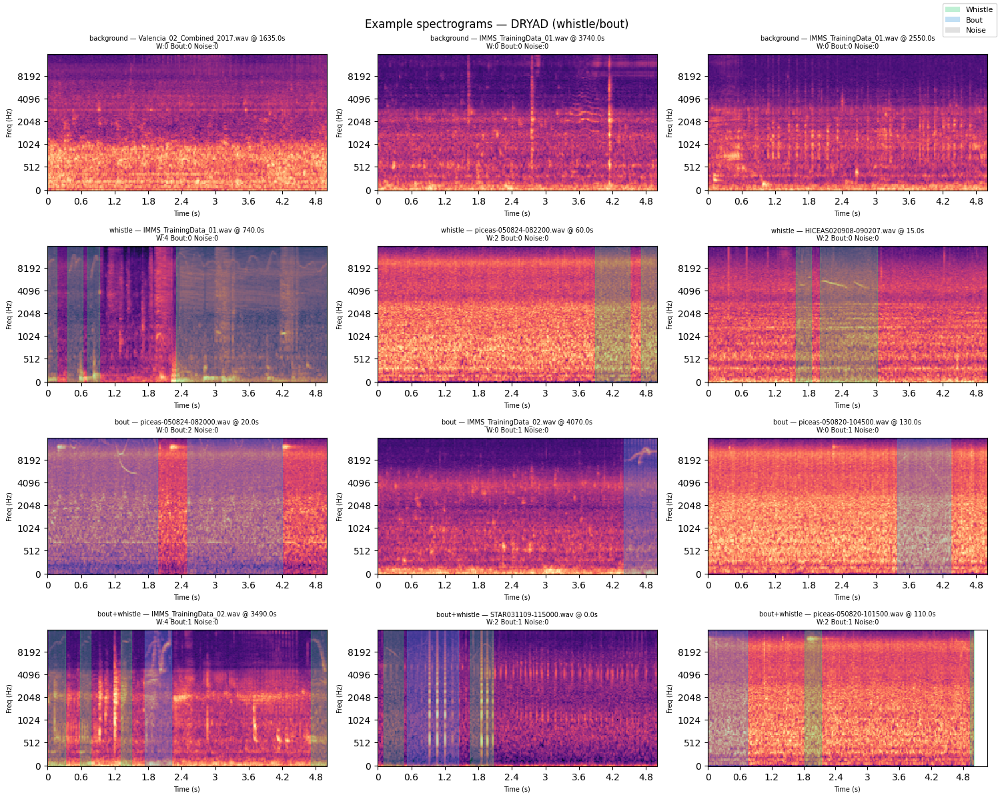

In [10]:
#@title Visualize example spectrograms (DRYAD — whistle/bout)

labels = ['background', 'whistle', 'bout', 'bout+whistle']
n_examples = 3
min_display_width = 0.08

ann_colors = {
    'Whistle': '#2ecc71',
    'Bout':    '#3498db',
    'Noise':   '#999999',
}

fig, axes = plt.subplots(len(labels), n_examples, figsize=(15, 12))

for row_idx, label in enumerate(labels):
    subset = windows_df[windows_df['label'] == label]
    n_avail = min(n_examples, len(subset))
    if n_avail == 0:
        for col_idx in range(n_examples):
            axes[row_idx][col_idx].axis('off')
        continue
    samples = subset.sample(n_avail, random_state=42)

    for col_idx in range(n_examples):
        ax = axes[row_idx][col_idx]
        if col_idx >= n_avail:
            ax.axis('off')
            continue

        row = samples.iloc[col_idx]
        audio_native, native_sr = librosa.load(
            row['wav_path'], sr=None,
            offset=row['offset_s'], duration=window_size_s, mono=True
        )
        audio = soxr.resample(audio_native, native_sr, sr)

        S = librosa.feature.melspectrogram(y=audio, sr=sr, n_mels=128, fmax=sr // 2)
        S_db = librosa.power_to_db(S, ref=np.max)

        librosa.display.specshow(S_db, sr=sr, x_axis='time', y_axis='mel', ax=ax)

        # Overlay raw annotations within this window
        audio_file = Path(row['wav_path']).name
        file_anns  = file_ann_lookup[audio_file]
        win_start  = row['offset_s']
        win_end    = win_start + window_size_s

        for ann in file_anns:
            if ann['end'] < win_start or ann['start'] > win_end:
                continue
            a_start = max(ann['start'], win_start) - win_start
            a_end   = min(ann['end'],   win_end)   - win_start
            if a_end > a_start:
                width  = max(a_end - a_start, min_display_width)
                center = (a_start + a_end) / 2
                color  = ann_colors.get(ann['label'], '#999999')
                ax.axvspan(center - width / 2, center + width / 2,
                           color=color, alpha=0.3)

        ax.set_title(
            f'{label} — {audio_file} @ {row["offset_s"]:.1f}s'
            f'\nW:{row["n_whistle"]} Bout:{row["n_bout"]} Noise:{row["n_noise"]}',
            fontsize=7
        )
        ax.set_xlabel('Time (s)', fontsize=7)
        ax.set_ylabel('Freq (Hz)', fontsize=7)

from matplotlib.patches import Patch
fig.legend(handles=[
    Patch(facecolor=v, alpha=0.3, label=k) for k, v in ann_colors.items()
], loc='upper right', fontsize=8)

plt.suptitle('Example spectrograms — DRYAD (whistle/bout)', fontsize=12)
plt.tight_layout()
os.makedirs(f'{save_dir}/figures', exist_ok=True)
plt.savefig(f'{save_dir}/figures/example_spectrograms.png', dpi=150, bbox_inches='tight')
plt.show()

# retrieving the data and performing zero-shot and fully-supervised classifications

In [6]:
X_clean =  np.load(f'{save_dir}/embeddings/X_embeddings.npy')  
y_clean = np.load(f'{save_dir}/embeddings/y_labels.npy')   
Z_clean = np.load(f'{save_dir}/embeddings/Z_logits.npy')   

metadata_clean = pd.read_csv(f'{save_dir}/embeddings/metadata.csv')

print(f'Clean shapes — X: {X_clean.shape}, Z: {Z_clean.shape}, y: {y_clean.shape}')
print(f'Class distribution:')
print(pd.Series(y_clean).value_counts())

Clean shapes — X: (6770, 1536), Z: (6770, 14795), y: (6770,)
Class distribution:
background      3854
whistle         2133
bout+whistle     641
bout             142
Name: count, dtype: int64


In [9]:
print('=== Full class distribution by subdataset ===')
print(metadata_clean.groupby(['subdataset', 'label']).size().to_string())

print('\n=== Background by subdataset ===')
bg_mask = metadata_clean['label'] == 'background'
print(metadata_clean[bg_mask]['subdataset'].value_counts().to_string())
print(f'\nTotal background:     {bg_mask.sum()}')
print(f'Total non-background: {(~bg_mask).sum()}')
print(f'Total:                {len(metadata_clean)}')

=== Full class distribution by subdataset ===
subdataset     label       
IMMS           background      2056
               bout              21
               bout+whistle      99
               whistle          666
Oceanographic  background      1645
               bout              35
               bout+whistle     171
               whistle         1035
SWFSC          background       153
               bout              86
               bout+whistle     371
               whistle          432

=== Background by subdataset ===
subdataset
IMMS             2056
Oceanographic    1645
SWFSC             153

Total background:     3854
Total non-background: 2916
Total:                6770


In [14]:
# Search for dolphin/whale/cetacean related classes
for name in perch_class_names:
    if any(term in name.lower() for term in ['dolphin', 'tursiops', 'whale', 'cetac', 'porpoise', 'whistle', 'cetacean', 'delphinus', 'delphin', 'cetacea']):
        print(name)

print("\n--- Water/noise/background ---")
for name in perch_class_names:
    if any(term in name.lower() for term in ['water', 'noise', 'background', 'ambient', 'silence', 'rain', 'wave', 'ocean', 'sea']):
        print(name)

Colibri delphinae
Delphinapterus leucas
Myzomela adolphinae
Phylloscopus whistleri
Tursiops truncatus

--- Water/noise/background ---
Anstisia rosea
Anthus roseatus
Ardenna grisea
Boat_and_Water_vehicle
Cinnyris osea
Conocephalus oceanicus
Coracina caeruleogrisea
Ducula oceanica
Formicivora grisea
Gull_and_seagull
Lycalopex grisea
Microwave_oven
Myiagra oceanica
Myopsalta waterhousei
Myrmotherula grisea
Ocean
Oceanites gracilis
Oceanites oceanicus
Oceanites pincoyae
Petroica rosea
Platycleis grisea
Poecilimon ukrainicus
Prioniturus waterstradti
Psittacula roseata
Rain
Raindrop
Rhodinocichla rosea
Rhodostethia rosea
Sarothrura watersi
Streptopelia roseogrisea
Tachycineta euchrysea
Tamasa rainbowi
Teleogryllus oceanicus
Thalurania watertonii
Traffic_noise_and_roadway_noise
Train
Water
Water_tap_and_faucet
Waves_and_surf
Zoothera talaseae


In [13]:
#@title Zero-shot species analysis — what does Perch think your sounds are? (DRYAD)

class_names_list = list(embedding_model.class_list['labels'].classes)

masks = {
    'background':   y_clean == 'background',
    'whistle':      y_clean == 'whistle',
    'bout':         y_clean == 'bout',
    'bout+whistle': y_clean == 'bout+whistle',
}

mean_logits = {label: Z_clean[mask].mean(axis=0) for label, mask in masks.items() if mask.sum() > 0}

for label, logits in mean_logits.items():
    top_idx = np.argsort(logits)[::-1][:20]
    print(f'TOP 20 PERCH CLASSES FOR {label.upper()} WINDOWS (n={masks[label].sum()}):')
    print('-' * 50)
    for idx in top_idx:
        print(f'  {logits[idx]:6.3f}  {class_names_list[idx]}')
    print()

# --- Candidate comparison ---
# Adjust or remove entries if these exact strings aren't in Perch's class list
dolphin_candidates = {}
for name in ['Tursiops truncatus', 
             'Delphinus delphis']:
    if name in class_names_list:
        dolphin_candidates[name] = class_names_list.index(name)
    else:
        print(f'  [WARN] "{name}" not found in Perch class list — skipping')

background_candidates = {}
for name in ['Water', 'Ocean', 'Boat_and_Water_vehicle']:
    if name in class_names_list:
        background_candidates[name] = class_names_list.index(name)
    else:
        print(f'  [WARN] "{name}" not found in Perch class list — skipping')

def print_candidate_table(title, candidates):
    if not candidates:
        print(f'{title}: no valid candidates found.\n')
        return
    col_w = 16
    print(f'\n{title}')
    print('-' * (32 + col_w * len(mean_logits)))
    header = f'  {"Species/Class":30s}' + ''.join(f'  {l:>{col_w-2}s}' for l in mean_logits)
    print(header)
    print('-' * (32 + col_w * len(mean_logits)))
    for name, idx in candidates.items():
        row = f'  {name:30s}'
        for logits in mean_logits.values():
            rank = np.where(np.argsort(logits)[::-1] == idx)[0][0] + 1
            row += f'  {logits[idx]:6.3f} (#{rank:<4d})'
        print(row)
    print()

print_candidate_table('DOLPHIN CANDIDATES — mean logit across label types:', dolphin_candidates)
print_candidate_table('BACKGROUND CANDIDATES — mean logit across label types:', background_candidates)

TOP 20 PERCH CLASSES FOR BACKGROUND WINDOWS (n=3854):
--------------------------------------------------
   5.991  Domestic_sounds_and_home_sounds
   5.464  Water
   4.992  Liquid
   4.875  Agelaius phoeniceus
   4.841  Bubo virginianus
   4.761  Vehicle
   4.724  Sink_(filling_or_washing)
   4.650  Strix aluco
   4.540  Strix varia
   4.538  Animal
   4.537  Turdus merula
   4.501  Corvus corax
   4.440  Water_tap_and_faucet
   4.402  Phylloscopus collybita
   4.375  Toilet_flush
   4.339  Fringilla coelebs
   4.335  Rallus aquaticus
   4.327  Cardinalis cardinalis
   4.275  Erithacus rubecula
   4.270  Asio otus

TOP 20 PERCH CLASSES FOR WHISTLE WINDOWS (n=2133):
--------------------------------------------------
   5.508  Domestic_sounds_and_home_sounds
   5.369  Sturnus vulgaris
   5.240  Molothrus ater
   4.861  Animal
   4.767  Turdus merula
   4.540  Vehicle
   4.511  Water
   4.450  Phylloscopus collybita
   4.450  Erithacus rubecula
   4.448  Fringilla coelebs
   4.439  Strix 

In [14]:
#@title Train / test split — using predefined DRYAD splits

le = LabelEncoder()
y_enc = le.fit_transform(y_clean)
class_names = list(le.classes_)
print('Classes:', class_names)

# Use the predefined split from metadata
split_col = metadata_clean['split'].values

train_mask = split_col == 'train'
test_mask  = split_col == 'test'

X_train, y_train, Z_train = X_clean[train_mask], y_enc[train_mask], Z_clean[train_mask]
X_test,  y_test,  Z_test  = X_clean[test_mask],  y_enc[test_mask],  Z_clean[test_mask]

print(f'Train: {train_mask.sum()}  |  Test: {test_mask.sum()}')
print(f'\nTrain class distribution:')
print(pd.Series(le.inverse_transform(y_train)).value_counts().to_string())
print(f'\nTest class distribution:')
print(pd.Series(le.inverse_transform(y_test)).value_counts().to_string())

# Sanity check — confirm test files match expected
test_files = metadata_clean[test_mask]['wav_path'].apply(lambda p: Path(p).name).unique()
print(f'\nTest files ({len(test_files)}):')
for f in sorted(test_files):
    print(f'  {f}')

Classes: ['background', 'bout', 'bout+whistle', 'whistle']
Train: 5848  |  Test: 922

Train class distribution:
background      3517
whistle         1693
bout+whistle     515
bout             123

Test class distribution:
whistle         440
background      337
bout+whistle    126
bout             19

Test files (6):
  IMMS_Combined_Test.wav
  Oceanographic.170317.144622.wav
  piceas-050820-095000.wav
  piceas-050820-101000.wav
  piceas-050820-101500.wav
  piceas-050820-104500.wav


Tursiops truncatus was a little bit higher up in the ranking, so we are going to use it as a proxy for delphinid presence

In [15]:
#@title Zero-shot evaluation (Perch V2 built-in logits)

label_to_perch = {
    'burst_pulse': 'Tursiops truncatus',
    'feeding_buzz': 'Tursiops truncatus',
    'whistle': 'Tursiops truncatus',
    'echolocation': 'Tursiops truncatus',
    'background': 'Water',
}

print('Label → Perch V2 class mapping:')
for cls in class_names:
    mapped = label_to_perch.get(cls, None)
    status = '✓' if mapped else '✗ NOT FOUND'
    print(f'  {cls:30s} → {str(mapped):40s} {status}')

def zero_shot_predict(Z_subset):
    preds = []
    for logits in Z_subset:
        scores = {}
        for cls in class_names:
            pname = label_to_perch.get(cls)
            if pname and pname in perch_class_names:
                scores[cls] = logits[perch_class_names.index(pname)]
            else:
                scores[cls] = -np.inf
        preds.append(max(scores, key=scores.get))
    return le.transform(preds)

y_pred_zs = zero_shot_predict(Z_test)

print('\n' + '=' * 60)
print('ZERO-SHOT (Perch V2 built-in logits)')
print('=' * 60)
print(classification_report(y_test, y_pred_zs, target_names=class_names))

Label → Perch V2 class mapping:
  background                     → Water                                    ✓
  bout                           → None                                     ✗ NOT FOUND
  bout+whistle                   → None                                     ✗ NOT FOUND
  whistle                        → Tursiops truncatus                       ✓

ZERO-SHOT (Perch V2 built-in logits)
              precision    recall  f1-score   support

  background       0.37      1.00      0.54       337
        bout       0.00      0.00      0.00        19
bout+whistle       0.00      0.00      0.00       126
     whistle       0.00      0.00      0.00       440

    accuracy                           0.37       922
   macro avg       0.09      0.25      0.13       922
weighted avg       0.13      0.37      0.20       922



/data2/mromaniuc/cet-det/venv/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
/data2/mromaniuc/cet-det/venv/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
/data2/mromaniuc/cet-det/venv/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is

In [17]:
#@title Remap labels and apply predefined split

# Collapse: whistle+bout → whistle, drop pure bout
remap = {
    'background':   'background',
    'whistle':      'whistle',
    'bout+whistle': 'whistle',   # has whistles, keep as whistle
    'bout':         'whistle',      
}

remapped = np.array([remap[l] for l in y_clean])
keep_mask = remapped != None

X_clean2 = X_clean[keep_mask]
Z_clean2 = Z_clean[keep_mask]
y_clean2 = remapped[keep_mask]
meta2    = metadata_clean[keep_mask].reset_index(drop=True)

print(f'\nClass distribution:')
print(pd.Series(y_clean2).value_counts().to_string())

# Predefined split
split_col = meta2['split'].values
train_mask = split_col == 'train'
test_mask  = split_col == 'test'

le = LabelEncoder()
y_enc = le.fit_transform(y_clean2)
class_names = list(le.classes_)
print(f'\nClasses: {class_names}')

X_train, y_train, Z_train = X_clean2[train_mask], y_enc[train_mask], Z_clean2[train_mask]
X_test,  y_test,  Z_test  = X_clean2[test_mask],  y_enc[test_mask],  Z_clean2[test_mask]

print(f'\nTrain: {len(X_train)}  |  Test: {len(X_test)}')
print(f'\nTrain class distribution:')
print(pd.Series(le.inverse_transform(y_train)).value_counts().to_string())
print(f'\nTest class distribution:')
print(pd.Series(le.inverse_transform(y_test)).value_counts().to_string())


Class distribution:
background    3854
whistle       2916

Classes: ['background', 'whistle']

Train: 5848  |  Test: 922

Train class distribution:
background    3517
whistle       2331

Test class distribution:
whistle       585
background    337


Multi-class handling: 5 classes, unbalanced

In [18]:
#@title Train classifiers + track metrics (binary: background / whistle)
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.metrics import roc_auc_score, f1_score, classification_report
import time

scaler = StandardScaler()
X_train_sc = scaler.fit_transform(X_train)
X_test_sc  = scaler.transform(X_test)

classifiers = {
    'Logistic Regression': LogisticRegression(
        max_iter=1000, random_state=random_seed, class_weight='balanced'
    ),
    'Decision Tree': DecisionTreeClassifier(
        max_depth=10, random_state=random_seed, class_weight='balanced'
    ),
    'Random Forest': RandomForestClassifier(
        n_estimators=200, random_state=random_seed, class_weight='balanced', n_jobs=-1
    ),
    'SVM (RBF)': SVC(
        kernel='rbf', class_weight='balanced', random_state=random_seed, probability=True
    ),
}

# whistle is positive class
whistle_idx = list(le.classes_).index('whistle')

results = {}

for name, clf in classifiers.items():
    print(f'\nTraining {name}...')
    t0 = time.time()

    clf.fit(X_train_sc, y_train)
    y_pred  = clf.predict(X_test_sc)
    y_proba = clf.predict_proba(X_test_sc)[:, whistle_idx]
    elapsed = time.time() - t0

    f1_macro    = f1_score(y_test, y_pred, average='macro')
    f1_per_class = f1_score(y_test, y_pred, average=None, labels=range(len(class_names)))
    train_acc   = clf.score(X_train_sc, y_train)
    test_acc    = clf.score(X_test_sc,  y_test)
    auc         = roc_auc_score(y_test, y_proba)

    results[name] = {
        'clf': clf, 'y_pred': y_pred, 'y_proba': y_proba,
        'f1_macro': f1_macro, 'f1_per_class': f1_per_class,
        'train_acc': train_acc, 'test_acc': test_acc,
        'auc': auc, 'time_s': elapsed,
    }

    print(f'  Time: {elapsed:.1f}s | Train: {train_acc:.4f} | Test: {test_acc:.4f} | '
          f'Macro F1: {f1_macro:.4f} | ROC AUC: {auc:.4f}')
    print(classification_report(y_test, y_pred, target_names=class_names))

# Summary
print('\n' + '=' * 80)
print('SUMMARY — BINARY EVALUATION (background / whistle)')
print('=' * 80)
print(f'{"Classifier":<22} {"Macro F1":>8} {"ROC AUC":>8} {"Train":>8} {"Test":>8} {"Gap":>6} {"Time":>6}')
print('-' * 80)
for name, res in sorted(results.items(), key=lambda x: x[1]['f1_macro'], reverse=True):
    gap = abs(res['train_acc'] - res['test_acc'])
    print(f'{name:<22} {res["f1_macro"]:>8.4f} {res["auc"]:>8.4f} '
          f'{res["train_acc"]:>8.4f} {res["test_acc"]:>8.4f} {gap:>6.4f} {res["time_s"]:>6.1f}s')

print('\n' + '=' * 80)
print('PER-CLASS F1')
print('=' * 80)
header = f'{"Classifier":<22}' + ''.join(f' {cn:>12s}' for cn in class_names)
print(header)
print('-' * 80)
for name, res in sorted(results.items(), key=lambda x: x[1]['f1_macro'], reverse=True):
    row = f'{name:<22}' + ''.join(f' {f1:>12.4f}' for f1 in res['f1_per_class'])
    print(row)


Training Logistic Regression...
  Time: 0.3s | Train: 1.0000 | Test: 0.9403 | Macro F1: 0.9356 | ROC AUC: 0.9801
              precision    recall  f1-score   support

  background       0.92      0.91      0.92       337
     whistle       0.95      0.96      0.95       585

    accuracy                           0.94       922
   macro avg       0.94      0.93      0.94       922
weighted avg       0.94      0.94      0.94       922


Training Decision Tree...
  Time: 10.4s | Train: 0.9860 | Test: 0.9067 | Macro F1: 0.8992 | ROC AUC: 0.8602
              precision    recall  f1-score   support

  background       0.88      0.87      0.87       337
     whistle       0.92      0.93      0.93       585

    accuracy                           0.91       922
   macro avg       0.90      0.90      0.90       922
weighted avg       0.91      0.91      0.91       922


Training Random Forest...
  Time: 2.0s | Train: 1.0000 | Test: 0.9414 | Macro F1: 0.9365 | ROC AUC: 0.9810
              p

In [19]:
#@title PyTorch MLP with Dropout (binary: background / whistle)

import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import classification_report, f1_score, roc_auc_score, accuracy_score
import copy
import time

torch_mlp_configs = {
    'PyTorch MLP (128) drop=0.4': {
        'hidden': (128,), 'dropout': 0.4, 'lr': 1e-4,
        'weight_decay': 1e-3, 'epochs': 300, 'patience': 30, 'batch_size': 256,
    },
    'PyTorch MLP (64) drop=0.4': {
        'hidden': (64,), 'dropout': 0.4, 'lr': 1e-4,
        'weight_decay': 1e-3, 'epochs': 300, 'patience': 30, 'batch_size': 256,
    },
}

def build_mlp(input_dim, hidden_sizes, dropout, n_classes):
    layers = []
    in_dim = input_dim
    for h in hidden_sizes:
        layers += [nn.Linear(in_dim, h), nn.ReLU(), nn.Dropout(dropout)]
        in_dim = h
    layers.append(nn.Linear(in_dim, n_classes))
    return nn.Sequential(*layers)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'Using device: {device}')

n_classes = len(class_names)  # 2
whistle_idx = list(le.classes_).index('whistle')

class_counts = np.bincount(y_train)
class_weights = torch.tensor(
    [class_counts.sum() / (n_classes * c) for c in class_counts],
    dtype=torch.float32
).to(device)
print(f'Class weights: {dict(zip(class_names, class_weights.cpu().numpy().round(3)))}')

mlp_results = {}

for name, cfg in torch_mlp_configs.items():
    print(f'\nTraining {name}...')

    X_tr, X_val, y_tr, y_val = train_test_split(
        X_train_sc, y_train, test_size=0.15,
        random_state=random_seed, stratify=y_train
    )

    X_tr_t  = torch.tensor(X_tr,  dtype=torch.float32).to(device)
    y_tr_t  = torch.tensor(y_tr,  dtype=torch.long).to(device)
    X_val_t = torch.tensor(X_val, dtype=torch.float32).to(device)
    y_val_t = torch.tensor(y_val, dtype=torch.long).to(device)
    X_te_t  = torch.tensor(X_test_sc, dtype=torch.float32).to(device)

    loader = DataLoader(TensorDataset(X_tr_t, y_tr_t),
                        batch_size=cfg['batch_size'], shuffle=True)

    model     = build_mlp(X_train_sc.shape[1], cfg['hidden'], cfg['dropout'], n_classes).to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr=cfg['lr'], weight_decay=cfg['weight_decay'])
    criterion = nn.CrossEntropyLoss(weight=class_weights)

    best_val_loss    = float('inf')
    patience_counter = 0
    best_state       = None
    train_losses, val_losses = [], []
    train_accs,   val_accs   = [], []
    best_epoch    = 0
    early_stopped = False

    t0 = time.time()

    for epoch in range(1, cfg['epochs'] + 1):
        model.train()
        for xb, yb in loader:
            optimizer.zero_grad()
            criterion(model(xb), yb).backward()
            optimizer.step()

        model.eval()
        with torch.no_grad():
            tr_logits  = model(X_tr_t)
            val_logits = model(X_val_t)
            tr_loss    = criterion(tr_logits,  y_tr_t).item()
            val_loss   = criterion(val_logits, y_val_t).item()
            tr_acc     = (tr_logits.argmax(1)  == y_tr_t).float().mean().item()
            val_acc    = (val_logits.argmax(1) == y_val_t).float().mean().item()

        train_losses.append(tr_loss); val_losses.append(val_loss)
        train_accs.append(tr_acc);   val_accs.append(val_acc)

        if val_loss < best_val_loss:
            best_val_loss = val_loss; patience_counter = 0
            best_epoch = epoch; best_state = copy.deepcopy(model.state_dict())
        else:
            patience_counter += 1
        if patience_counter >= cfg['patience']:
            early_stopped = True
            break

    model.load_state_dict(best_state)
    model.eval()
    with torch.no_grad():
        test_logits = model(X_te_t)
        test_proba  = torch.softmax(test_logits, dim=1).cpu().numpy()[:, whistle_idx]  # binary → 1D
        test_pred   = test_logits.argmax(1).cpu().numpy()

    elapsed = time.time() - t0

    f1_macro     = f1_score(y_test, test_pred, average='macro')
    f1_per_class = f1_score(y_test, test_pred, average=None, labels=range(n_classes))
    test_acc     = accuracy_score(y_test, test_pred)
    auc          = roc_auc_score(y_test, test_proba)   # binary → no multi_class arg

    mlp_results[name] = {
        'y_pred': test_pred, 'y_proba': test_proba,
        'f1_macro': f1_macro, 'f1_per_class': f1_per_class,
        'train_acc': train_accs[-1], 'test_acc': test_acc,
        'auc': auc, 'time_s': elapsed, 'n_iter': len(train_losses),
        'train_losses': train_losses, 'val_losses': val_losses,
        'train_accs': train_accs, 'val_accs': val_accs,
        'best_epoch': best_epoch, 'early_stopped': early_stopped,
    }

    print(f'  Epochs: {len(train_losses)} | Best: {best_epoch} | Early stop: {early_stopped}')
    print(f'  Time: {elapsed:.1f}s | Train Acc: {train_accs[-1]:.4f} | '
          f'Test Acc: {test_acc:.4f} | Macro F1: {f1_macro:.4f} | AUC: {auc:.4f}')
    print(classification_report(y_test, test_pred, target_names=class_names, zero_division=0))

# Summary
print('\n' + '=' * 95)
print('PyTorch MLP SUMMARY (binary: background / whistle)')
print('=' * 95)
print(f'{"Model":<40} {"Macro F1":>8} {"AUC":>8} {"Train":>8} {"Test":>8} {"Gap":>6} {"Epochs":>7} {"Time":>8}')
print('-' * 95)
for name, res in sorted(mlp_results.items(), key=lambda x: x[1]['f1_macro'], reverse=True):
    gap = abs(res['train_acc'] - res['test_acc'])
    print(f'{name:<40} {res["f1_macro"]:>8.4f} {res["auc"]:>8.4f} '
          f'{res["train_acc"]:>8.4f} {res["test_acc"]:>8.4f} '
          f'{gap:>6.4f} {res["n_iter"]:>7} {res["time_s"]:>8.1f}s')

if 'results' in dir():
    results.update(mlp_results)
    print('\n✓ PyTorch MLP results merged into overall results dict.')

Using device: cuda
Class weights: {'background': 0.831, 'whistle': 1.254}

Training PyTorch MLP (128) drop=0.4...
  Epochs: 47 | Best: 17 | Early stop: True
  Time: 3.8s | Train Acc: 0.9964 | Test Acc: 0.9414 | Macro F1: 0.9361 | AUC: 0.9854
              precision    recall  f1-score   support

  background       0.94      0.89      0.92       337
     whistle       0.94      0.97      0.95       585

    accuracy                           0.94       922
   macro avg       0.94      0.93      0.94       922
weighted avg       0.94      0.94      0.94       922


Training PyTorch MLP (64) drop=0.4...
  Epochs: 56 | Best: 26 | Early stop: True
  Time: 4.9s | Train Acc: 0.9936 | Test Acc: 0.9436 | Macro F1: 0.9385 | AUC: 0.9863
              precision    recall  f1-score   support

  background       0.95      0.90      0.92       337
     whistle       0.94      0.97      0.96       585

    accuracy                           0.94       922
   macro avg       0.94      0.93      0.94   

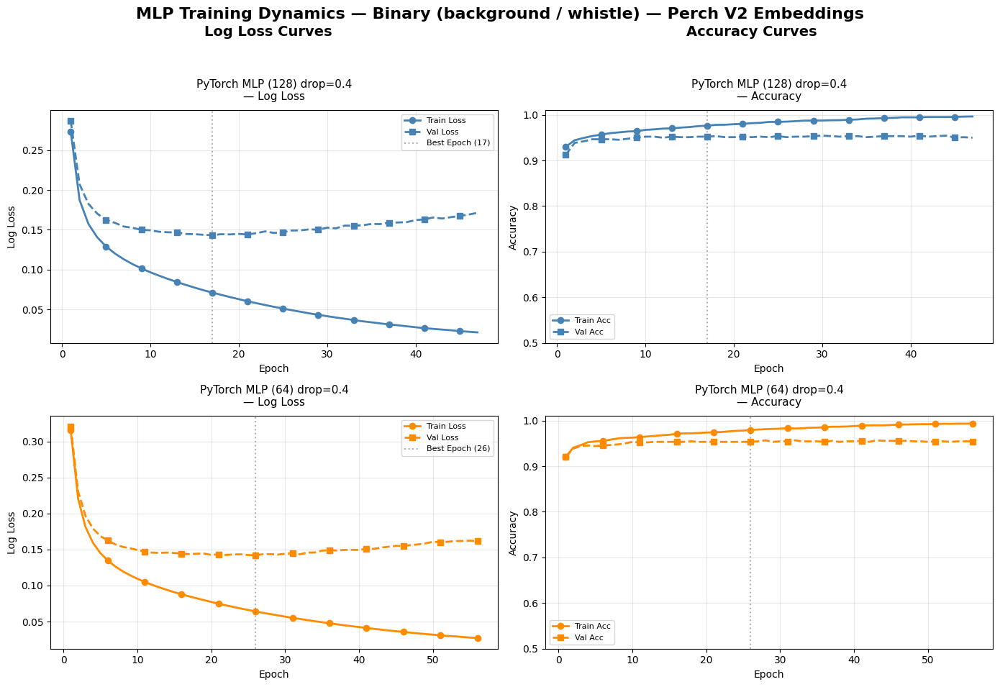

In [20]:
import matplotlib.pyplot as plt
import numpy as np

color_palette = ['steelblue', 'darkorange', 'seagreen']
colors = {name: color_palette[i % len(color_palette)] for i, name in enumerate(mlp_results)}

n_models = len(mlp_results)
fig, axes = plt.subplots(n_models, 2, figsize=(14, 5 * n_models))
if n_models == 1:
    axes = axes[np.newaxis, :]  # ensure 2D indexing works

fig.suptitle('MLP Training Dynamics — Binary (background / whistle) — Perch V2 Embeddings',
             fontsize=16, fontweight='bold', y=0.98)        

for idx, (name, res) in enumerate(mlp_results.items()):
    color = colors[name]
    epochs = np.arange(1, res['n_iter'] + 1)

    ax_loss = axes[idx, 0]
    ax_loss.plot(epochs, res['train_losses'], label='Train Loss',
                 color=color, linewidth=2, marker='o', markevery=max(1, len(epochs)//10))
    ax_loss.plot(epochs, res['val_losses'], label='Val Loss',
                 color=color, linestyle='--', linewidth=2, marker='s', markevery=max(1, len(epochs)//10))
    ax_loss.axvline(res['best_epoch'], color='gray', linestyle=':', alpha=0.6,
                    label=f'Best Epoch ({res["best_epoch"]})')
    ax_loss.set_title(f'{name}\n— Log Loss', fontsize=11, pad=10)
    ax_loss.set_xlabel('Epoch')
    ax_loss.set_ylabel('Log Loss')
    ax_loss.legend(fontsize=8)
    ax_loss.grid(alpha=0.3)

    ax_acc = axes[idx, 1]
    ax_acc.plot(epochs, res['train_accs'], label='Train Acc',
                color=color, linewidth=2, marker='o', markevery=max(1, len(epochs)//10))
    ax_acc.plot(epochs, res['val_accs'], label='Val Acc',
                color=color, linestyle='--', linewidth=2, marker='s', markevery=max(1, len(epochs)//10))
    ax_acc.axvline(res['best_epoch'], color='gray', linestyle=':', alpha=0.6)
    ax_acc.set_title(f'{name}\n— Accuracy', fontsize=11, pad=10)
    ax_acc.set_xlabel('Epoch')
    ax_acc.set_ylabel('Accuracy')
    ax_acc.legend(fontsize=8)
    ax_acc.grid(alpha=0.3)
    ax_acc.set_ylim(0.5, 1.01)

plt.tight_layout(rect=[0, 0.03, 1, 0.93])
fig.text(0.27, 0.94, 'Log Loss Curves', fontsize=14, fontweight='bold', ha='center')
fig.text(0.75, 0.94, 'Accuracy Curves', fontsize=14, fontweight='bold', ha='center')

plt.savefig(f'{save_dir}/figures/mlp_4chart_diagnostics.png', dpi=150, bbox_inches='tight')
plt.show()

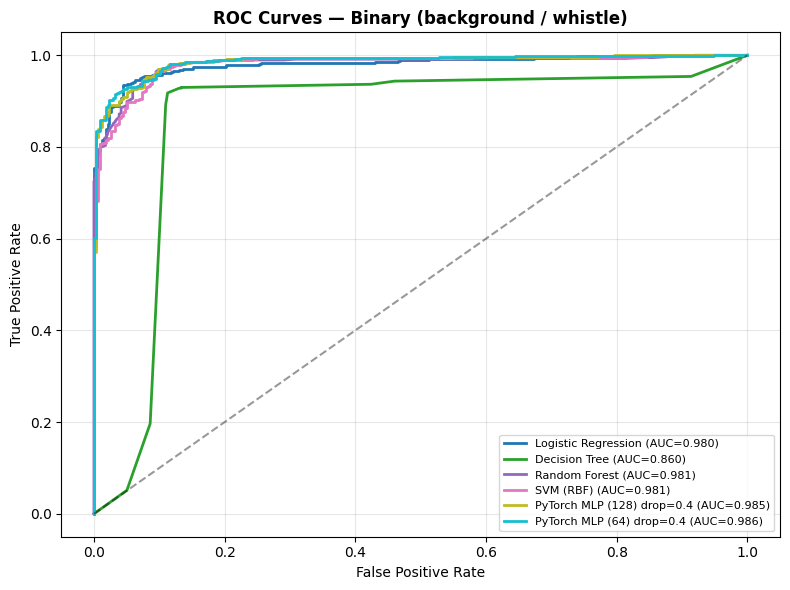

In [21]:
#@title ROC Curves — ALL classifiers (binary: background / whistle)

from sklearn.metrics import roc_curve, roc_auc_score
import matplotlib.pyplot as plt
import numpy as np

# Collect all results (sklearn + MLP)
all_results = {**results, **mlp_results}

colors = plt.cm.tab10(np.linspace(0, 1, len(all_results)))

fig, ax = plt.subplots(figsize=(8, 6))

for (name, res), color in zip(all_results.items(), colors):
    proba = res['y_proba']
    # MLP probas are already 1D; sklearn probas are 2D — extract whistle column
    if proba.ndim == 2:
        proba = proba[:, whistle_idx]
    fpr, tpr, _ = roc_curve(y_test, proba)
    auc = roc_auc_score(y_test, proba)
    ax.plot(fpr, tpr, label=f'{name} (AUC={auc:.3f})', color=color, linewidth=2)

ax.plot([0, 1], [0, 1], 'k--', alpha=0.4)
ax.set_xlabel('False Positive Rate')
ax.set_ylabel('True Positive Rate')
ax.set_title('ROC Curves — Binary (background / whistle)', fontsize=12, fontweight='bold')
ax.legend(loc='lower right', fontsize=8)
ax.grid(alpha=0.3)

plt.tight_layout()
plt.savefig(f'{save_dir}/figures/roc_curves_binary.png', dpi=150, bbox_inches='tight')
plt.show()

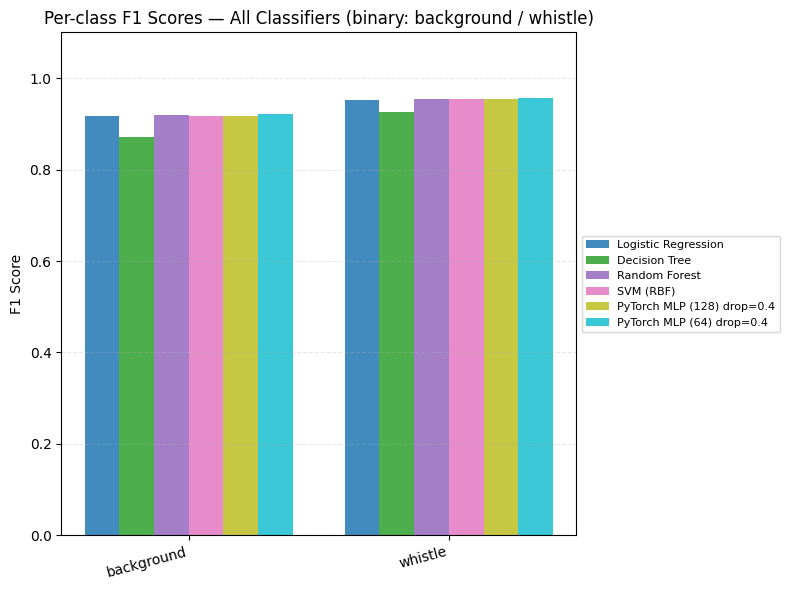

In [22]:
#@title Per-class F1 comparison bar chart — binary (background / whistle)

import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import f1_score

all_results = {**results, **mlp_results}

n_clf = len(all_results)
n_cls = len(class_names)  # 2

colors = plt.cm.tab10(np.linspace(0, 1, min(n_clf, 10)))
x = np.arange(n_cls)
width = 0.8 / n_clf

fig, ax = plt.subplots(figsize=(8, 6))

for i, (name, res) in enumerate(all_results.items()):
    f1_per = f1_score(y_test, res['y_pred'],
                      labels=list(range(n_cls)), average=None, zero_division=0)
    offset = (i - n_clf / 2 + 0.5) * width
    ax.bar(x + offset, f1_per, width, label=name,
           color=colors[i % len(colors)], alpha=0.85)

ax.set_xticks(x)
ax.set_xticklabels(class_names, rotation=15, ha='right')
ax.set_ylabel('F1 Score')
ax.set_ylim(0, 1.1)
ax.set_title('Per-class F1 Scores — All Classifiers (binary: background / whistle)')
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5), fontsize=8)
ax.grid(axis='y', linestyle='--', alpha=0.3)
plt.tight_layout()
plt.savefig(f'{save_dir}/figures/f1_comparison_all_classifiers_binary.png', dpi=150, bbox_inches='tight')
plt.show()

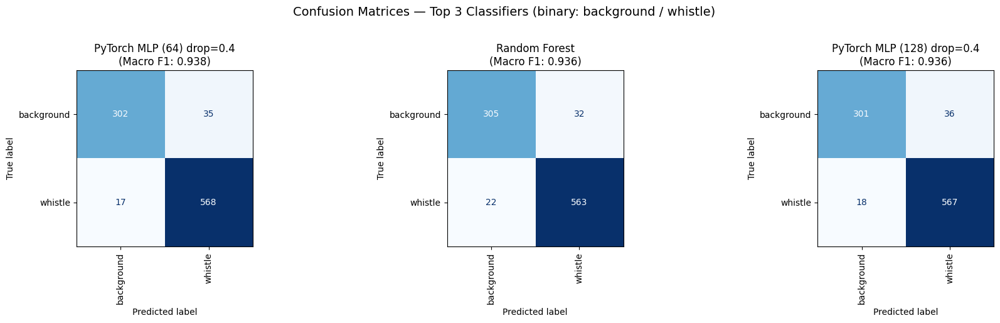

In [23]:
#@title Confusion matrices — Top N classifiers by Macro F1 (binary: background / whistle)
from sklearn.metrics import ConfusionMatrixDisplay
import matplotlib.pyplot as plt

TOP_N = 3

all_results = {**results, **mlp_results}
top = sorted(all_results.items(), key=lambda x: x[1]['f1_macro'], reverse=True)[:TOP_N]

fig, axes = plt.subplots(1, TOP_N, figsize=(6 * TOP_N, 5))
if TOP_N == 1:
    axes = [axes]

for ax, (name, res) in zip(axes, top):
    ConfusionMatrixDisplay.from_predictions(
        y_test, res['y_pred'],
        display_labels=class_names,
        ax=ax, colorbar=False, xticks_rotation='vertical', cmap='Blues'
    )
    ax.set_title(f'{name}\n(Macro F1: {res["f1_macro"]:.3f})')

plt.suptitle(f'Confusion Matrices — Top {TOP_N} Classifiers (binary: background / whistle)',
             fontsize=14, y=1.02)
plt.tight_layout()
plt.savefig(f'{save_dir}/figures/confusion_matrices_top{TOP_N}_binary.png', dpi=150, bbox_inches='tight')
plt.show()

In [24]:
#@title Save full results to CSV — ALL classifiers (binary: background / whistle)
from sklearn.metrics import precision_recall_fscore_support, roc_auc_score
import pandas as pd

all_results = {**results, **mlp_results}

rows = []
for name, res in all_results.items():
    proba = res['y_proba']
    if proba.ndim == 2:
        proba = proba[:, whistle_idx]
    try:
        auc = roc_auc_score(y_test, proba)
    except ValueError:
        auc = None

    p, r, f, s = precision_recall_fscore_support(
        y_test, res['y_pred'], labels=range(len(class_names)), zero_division=0
    )
    row = {
        'classifier':   name,
        'macro_f1':     res['f1_macro'],
        'roc_auc':      auc,
        'time_seconds': res.get('time_s', None),
    }
    for i, cls in enumerate(class_names):
        row[f'{cls}_precision'] = round(p[i], 3)
        row[f'{cls}_recall']    = round(r[i], 3)
        row[f'{cls}_f1']        = round(f[i], 3)
        row[f'{cls}_support']   = s[i]
    rows.append(row)

results_df = pd.DataFrame(rows)
cols = ['classifier', 'macro_f1', 'roc_auc', 'time_seconds'] + \
       [c for c in results_df.columns if c not in ['classifier', 'macro_f1', 'roc_auc', 'time_seconds']]
results_df = results_df[cols]

out_path = f'{save_dir}/perch_v2_all_classifiers_results_binary.csv'
results_df.to_csv(out_path, index=False)
print(f'Saved {len(results_df)} classifiers to {out_path}')
display(results_df.round(3))

Saved 6 classifiers to /data2/mromaniuc/cet-det/models/perch_v2/DRYAD/perch_v2_all_classifiers_results_binary.csv


,classifier,macro_f1,roc_auc,time_seconds,background_precision,background_recall,background_f1,background_support,whistle_precision,whistle_recall,whistle_f1,whistle_support
0,Logistic Regression,0.936,0.980,0.338,0.922,0.914,0.918,337,0.951,0.956,0.953,585
1,Decision Tree,0.899,0.860,10.429,0.877,0.866,0.872,337,0.924,0.930,0.927,585
2,Random Forest,0.936,0.981,1.981,0.933,0.905,0.919,337,0.946,0.962,0.954,585
3,SVM (RBF),0.935,0.981,45.213,0.943,0.890,0.916,337,0.939,0.969,0.954,585
4,PyTorch MLP (128) drop=0.4,0.936,0.985,3.785,0.944,0.893,0.918,337,0.940,0.969,0.955,585
5,PyTorch MLP (64) drop=0.4,0.938,0.986,4.942,0.947,0.896,0.921,337,0.942,0.971,0.956,585


Running full PCA...
Total components: 1536
Component  Variance Explained (%)  Cumulative (%)
      PC1                  8.0964          8.0964
      PC2                  5.9104         14.0068
      PC3                  4.4630         18.4698
      PC4                  3.6560         22.1258
      PC5                  2.7891         24.9149
      PC6                  2.0698         26.9847
      PC7                  1.8497         28.8345
      PC8                  1.7376         30.5721
      PC9                  1.5188         32.0909
     PC10                  1.3634         33.4544
     PC11                  1.3331         34.7874
     PC12                  1.3035         36.0909
     PC13                  1.2160         37.3069
     PC14                  1.1255         38.4325
     PC15                  1.0792         39.5117
     PC16                  1.0019         40.5135
     PC17                  0.9609         41.4744
     PC18                  0.9267         42.4011
     PC

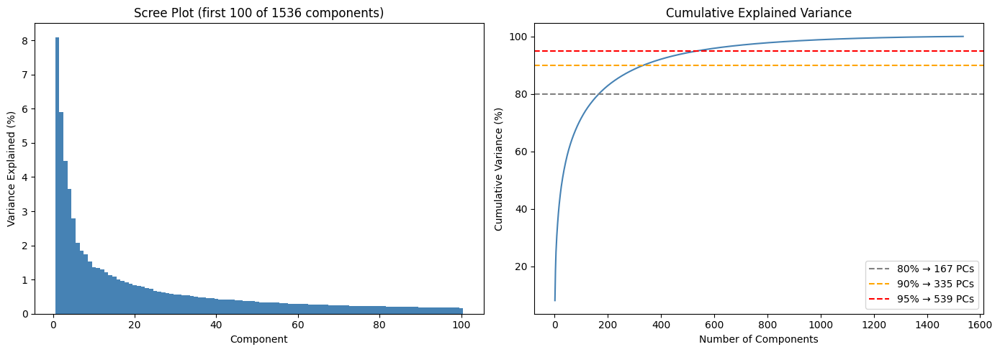

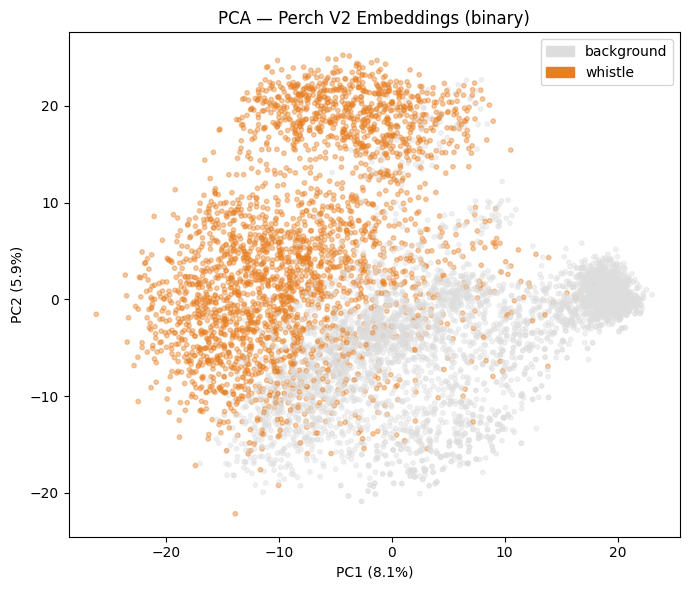

PCA-reduced shape for t-SNE/UMAP input: (6770, 335)

Running t-SNE...
  t-SNE metric: euclidean...
  t-SNE metric: cosine...
  t-SNE metric: manhattan...
  t-SNE metric: correlation...


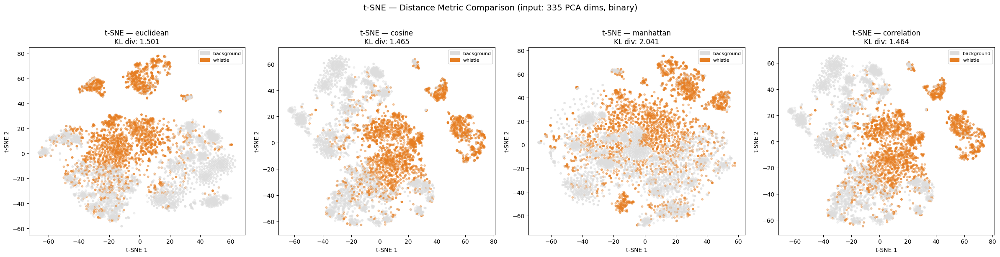


Running UMAP...
  UMAP metric: euclidean...
  UMAP metric: cosine...
  UMAP metric: manhattan...
  UMAP metric: correlation...


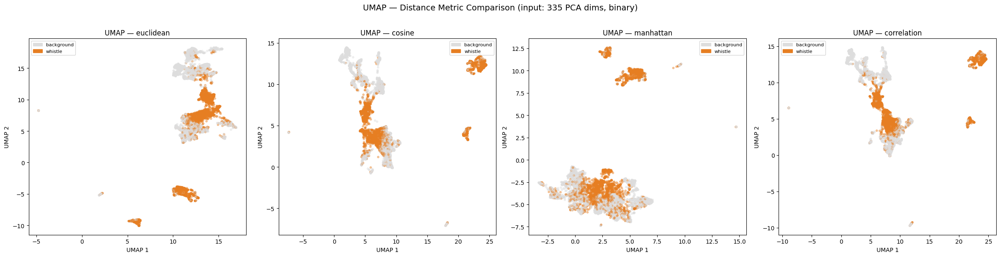


PCA input dims: 1536 → reduced to 335 (90% variance)

t-SNE KL Divergence by metric (lower = better fit):
  correlation      KL: 1.4643
  cosine           KL: 1.4650
  euclidean        KL: 1.5011
  manhattan        KL: 2.0414
All coordinates saved.


In [25]:
#@title Dimensionality reduction — PCA + t-SNE & UMAP (binary: background / whistle)
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import pandas as pd
import warnings
warnings.filterwarnings('ignore')

scaler_viz = StandardScaler()
X_scaled = scaler_viz.fit_transform(X_clean2)  # use the remapped/cleaned array

colors_map = {
    'background': '#DDDDDD',
    'whistle':    '#e67e22',
}
c = np.array([colors_map[label] for label in y_clean2])
alpha = 0.4
s = 10
legend_patches = [mpatches.Patch(color=v, label=k) for k, v in colors_map.items()]

os.makedirs(f'{save_dir}/dim_red', exist_ok=True)

# ═══════════════════════════════════════════════════════════════════════════════
# 1. FULL PCA — Variance analysis
# ═══════════════════════════════════════════════════════════════════════════════
print('Running full PCA...')
pca_full = PCA(random_state=random_seed)
pca_full.fit(X_scaled)

n_total  = len(pca_full.explained_variance_ratio_)
cumvar_full = np.cumsum(pca_full.explained_variance_ratio_) * 100

var_df = pd.DataFrame({
    'Component': [f'PC{i+1}' for i in range(n_total)],
    'Variance Explained (%)': pca_full.explained_variance_ratio_ * 100,
    'Cumulative (%)': cumvar_full
})
print(f'Total components: {n_total}')
print(var_df.head(30).to_string(index=False, float_format='%.4f'))

n80 = np.argmax(cumvar_full >= 80) + 1
n90 = np.argmax(cumvar_full >= 90) + 1
n95 = np.argmax(cumvar_full >= 95) + 1
n99 = np.argmax(cumvar_full >= 99) + 1
print(f'\nComponents for 80% variance: {n80}')
print(f'Components for 90% variance: {n90}')
print(f'Components for 95% variance: {n95}')
print(f'Components for 99% variance: {n99}')

n_pca = n90
print(f'→ Using {n_pca} PCA components for t-SNE/UMAP input (90% variance)')

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))
n_show = min(100, n_total)
ax1.bar(range(1, n_show + 1), pca_full.explained_variance_ratio_[:n_show] * 100,
        color='steelblue', width=1.0)
ax1.set_xlabel('Component')
ax1.set_ylabel('Variance Explained (%)')
ax1.set_title(f'Scree Plot (first {n_show} of {n_total} components)')

ax2.plot(range(1, n_total + 1), cumvar_full, color='steelblue')
ax2.axhline(80, color='gray',   linestyle='--', label=f'80% → {n80} PCs')
ax2.axhline(90, color='orange', linestyle='--', label=f'90% → {n90} PCs')
ax2.axhline(95, color='red',    linestyle='--', label=f'95% → {n95} PCs')
ax2.set_xlabel('Number of Components')
ax2.set_ylabel('Cumulative Variance (%)')
ax2.set_title('Cumulative Explained Variance')
ax2.legend()
plt.tight_layout()
plt.savefig(f'{save_dir}/dim_red/pca_full_variance_binary.png', dpi=150)
plt.show()

# PCA 2D scatter
pca2    = PCA(n_components=2, random_state=random_seed)
X_pca2  = pca2.fit_transform(X_scaled)

fig, ax = plt.subplots(figsize=(7, 6))
ax.scatter(X_pca2[:, 0], X_pca2[:, 1], c=c, alpha=alpha, s=s)
ax.set_xlabel(f'PC1 ({pca2.explained_variance_ratio_[0]*100:.1f}%)')
ax.set_ylabel(f'PC2 ({pca2.explained_variance_ratio_[1]*100:.1f}%)')
ax.set_title('PCA — Perch V2 Embeddings (binary)')
ax.legend(handles=legend_patches)
plt.tight_layout()
plt.savefig(f'{save_dir}/dim_red/pca_2d_binary.png', dpi=150)
plt.show()

# ═══════════════════════════════════════════════════════════════════════════════
# 2. PCA-reduce for t-SNE and UMAP input
# ═══════════════════════════════════════════════════════════════════════════════
pca_red   = PCA(n_components=n_pca, random_state=random_seed)
X_pca_red = pca_red.fit_transform(X_scaled)
print(f'PCA-reduced shape for t-SNE/UMAP input: {X_pca_red.shape}')

# ═══════════════════════════════════════════════════════════════════════════════
# 3. t-SNE — Multiple distance metrics
# ═══════════════════════════════════════════════════════════════════════════════
metrics = ['euclidean', 'cosine', 'manhattan', 'correlation']

print('\nRunning t-SNE...')
fig, axes = plt.subplots(1, 4, figsize=(24, 6))
tsne_results = {}

for ax, metric in zip(axes, metrics):
    print(f'  t-SNE metric: {metric}...')
    tsne = TSNE(
        n_components=2, perplexity=40, learning_rate='auto',
        init='random' if metric != 'euclidean' else 'pca',
        max_iter=1000, metric=metric,
        random_state=random_seed, verbose=0
    )
    X_tsne = tsne.fit_transform(X_pca_red)
    tsne_results[metric] = {'coords': X_tsne, 'kl': tsne.kl_divergence_}

    ax.scatter(X_tsne[:, 0], X_tsne[:, 1], c=c, alpha=alpha, s=s)
    ax.set_title(f't-SNE — {metric}\nKL div: {tsne.kl_divergence_:.3f}')
    ax.set_xlabel('t-SNE 1'); ax.set_ylabel('t-SNE 2')
    ax.legend(handles=legend_patches, fontsize=8)

plt.suptitle(f't-SNE — Distance Metric Comparison (input: {n_pca} PCA dims, binary)',
             fontsize=14, y=1.02)
plt.tight_layout()
plt.savefig(f'{save_dir}/dim_red/tsne_metrics_comparison_binary.png', dpi=150, bbox_inches='tight')
plt.show()

# ═══════════════════════════════════════════════════════════════════════════════
# 4. UMAP — Multiple distance metrics
# ═══════════════════════════════════════════════════════════════════════════════
print('\nRunning UMAP...')
try:
    import umap
except ImportError:
    import subprocess
    subprocess.run(['pip', 'install', 'umap-learn', '-q'])
    import umap

fig, axes = plt.subplots(1, 4, figsize=(24, 6))
umap_results = {}

for ax, metric in zip(axes, metrics):
    print(f'  UMAP metric: {metric}...')
    reducer = umap.UMAP(
        n_neighbors=30, min_dist=0.1, n_components=2,
        metric=metric, random_state=random_seed, verbose=False
    )
    X_umap = reducer.fit_transform(X_pca_red)
    umap_results[metric] = X_umap

    ax.scatter(X_umap[:, 0], X_umap[:, 1], c=c, alpha=alpha, s=s)
    ax.set_title(f'UMAP — {metric}')
    ax.set_xlabel('UMAP 1'); ax.set_ylabel('UMAP 2')
    ax.legend(handles=legend_patches, fontsize=8)

plt.suptitle(f'UMAP — Distance Metric Comparison (input: {n_pca} PCA dims, binary)',
             fontsize=14, y=1.02)
plt.tight_layout()
plt.savefig(f'{save_dir}/dim_red/umap_metrics_comparison_binary.png', dpi=150, bbox_inches='tight')
plt.show()

# ═══════════════════════════════════════════════════════════════════════════════
# 5. Summary + save coordinates
# ═══════════════════════════════════════════════════════════════════════════════
print('\n' + '=' * 60)
print(f'PCA input dims: {X_scaled.shape[1]} → reduced to {n_pca} (90% variance)')
print(f'\nt-SNE KL Divergence by metric (lower = better fit):')
for metric, data in sorted(tsne_results.items(), key=lambda x: x[1]['kl']):
    print(f'  {metric:15s}  KL: {data["kl"]:.4f}')

np.save(f'{save_dir}/dim_red/coords_pca2_binary.npy', X_pca2)
for metric in metrics:
    np.save(f'{save_dir}/dim_red/coords_tsne_{metric}_binary.npy', tsne_results[metric]['coords'])
    np.save(f'{save_dir}/dim_red/coords_umap_{metric}_binary.npy', umap_results[metric])
print('All coordinates saved.')

In [26]:
#@title Quantitative quality metrics — binary
from sklearn.metrics import silhouette_score
from sklearn.manifold import trustworthiness

le_viz = LabelEncoder()
y_viz  = le_viz.fit_transform(y_clean2)

print('\n' + '=' * 80)
print('QUANTITATIVE QUALITY METRICS (binary: background / whistle)')
print('=' * 80)
print(f'{"Method":<20} {"Metric":<15} {"Trustworthiness":>16} {"Silhouette":>12}')
print('-' * 80)

for metric, data in tsne_results.items():
    trust = trustworthiness(X_pca_red, data['coords'], n_neighbors=15)
    sil   = silhouette_score(data['coords'], y_viz)
    print(f'{"t-SNE":<20} {metric:<15} {trust:>16.4f} {sil:>12.4f}')

print()

for metric, coords in umap_results.items():
    trust = trustworthiness(X_pca_red, coords, n_neighbors=15)
    sil   = silhouette_score(coords, y_viz)
    print(f'{"UMAP":<20} {metric:<15} {trust:>16.4f} {sil:>12.4f}')

print()

trust_pca = trustworthiness(X_pca_red, X_pca2, n_neighbors=15)
sil_pca   = silhouette_score(X_pca2, y_viz)
print(f'{"PCA (2D)":<20} {"euclidean":<15} {trust_pca:>16.4f} {sil_pca:>12.4f}')


QUANTITATIVE QUALITY METRICS (binary: background / whistle)
Method               Metric           Trustworthiness   Silhouette
--------------------------------------------------------------------------------
t-SNE                euclidean                 0.9676       0.1842
t-SNE                cosine                    0.9729       0.1590
t-SNE                manhattan                 0.9404       0.1401
t-SNE                correlation               0.9733       0.1615

UMAP                 euclidean                 0.9488       0.1216
UMAP                 cosine                    0.9498       0.1046
UMAP                 manhattan                 0.9114       0.1301
UMAP                 correlation               0.9513       0.1092

PCA (2D)             euclidean                 0.7860       0.2827


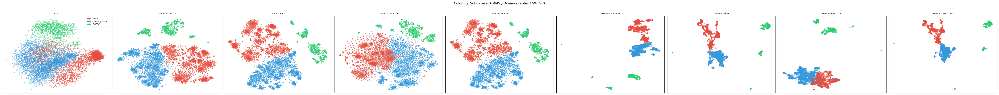

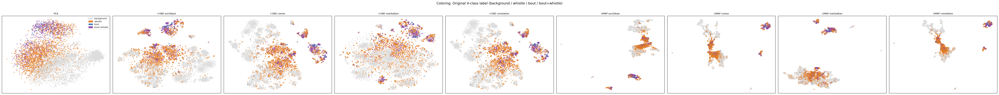

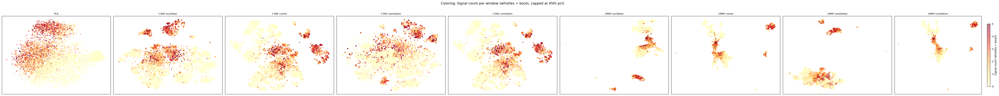

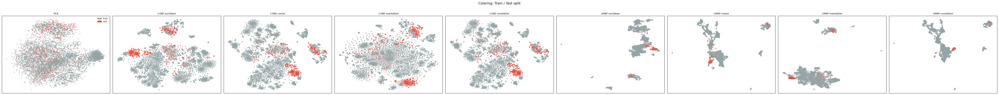

All coloring plots saved.


In [27]:
#@title Extended colorings — subdataset, label variants, signal density

import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import numpy as np

# ── Pull metadata aligned to X_clean2 ────────────────────────────────────────
# meta2 is already aligned to X_clean2 (built in the remap cell)
subdatasets  = meta2['subdataset'].values
splits       = meta2['split'].values
y_labels     = y_clean2  # 'background' / 'whistle'

# Full label including bout variants — pull from metadata
# meta2 still has the original 4-class label before remap
orig_labels  = meta2['label'].values   # background / whistle / bout / bout+whistle

# Signal count per window
signal_count = meta2['n_whistle'].values + meta2['n_bout'].values

# All projection methods to iterate over
projections = {
    'PCA':              X_pca2,
    't-SNE euclidean':  tsne_results['euclidean']['coords'],
    't-SNE cosine':     tsne_results['cosine']['coords'],
    't-SNE manhattan':  tsne_results['manhattan']['coords'],
    't-SNE correlation':tsne_results['correlation']['coords'],
    'UMAP euclidean':   umap_results['euclidean'],
    'UMAP cosine':      umap_results['cosine'],
    'UMAP manhattan':   umap_results['manhattan'],
    'UMAP correlation': umap_results['correlation'],
}

alpha = 0.4
s     = 10
n_proj = len(projections)

# ═══════════════════════════════════════════════════════════════════════════════
# 1. BY SUBDATASET
# ═══════════════════════════════════════════════════════════════════════════════
subdataset_colors = {
    'IMMS':          '#e74c3c',
    'Oceanographic': '#3498db',
    'SWFSC':         '#2ecc71',
}
c_sub = np.array([subdataset_colors[s_] for s_ in subdatasets])

fig, axes = plt.subplots(1, n_proj, figsize=(6 * n_proj, 5))
for ax, (name, coords) in zip(axes, projections.items()):
    ax.scatter(coords[:, 0], coords[:, 1], c=c_sub, alpha=alpha, s=s)
    ax.set_title(name, fontsize=9)
    ax.set_xticks([]); ax.set_yticks([])

axes[0].legend(handles=[mpatches.Patch(color=v, label=k)
               for k, v in subdataset_colors.items()], fontsize=8)
plt.suptitle('Coloring: Subdataset (IMMS / Oceanographic / SWFSC)', fontsize=13, y=1.02)
plt.tight_layout()
plt.savefig(f'{save_dir}/dim_red/coloring_subdataset.png', dpi=150, bbox_inches='tight')
plt.show()

# ═══════════════════════════════════════════════════════════════════════════════
# 2. ORIGINAL 4-CLASS LABEL (adds bout / bout+whistle back in)
# ═══════════════════════════════════════════════════════════════════════════════
label4_colors = {
    'background':   '#DDDDDD',
    'whistle':      '#e67e22',
    'bout':         '#4682b4',
    'bout+whistle': '#8e44ad',
}
c_4 = np.array([label4_colors.get(l, '#999999') for l in orig_labels])

fig, axes = plt.subplots(1, n_proj, figsize=(6 * n_proj, 5))
for ax, (name, coords) in zip(axes, projections.items()):
    ax.scatter(coords[:, 0], coords[:, 1], c=c_4, alpha=alpha, s=s)
    ax.set_title(name, fontsize=9)
    ax.set_xticks([]); ax.set_yticks([])

axes[0].legend(handles=[mpatches.Patch(color=v, label=k)
               for k, v in label4_colors.items()], fontsize=8)
plt.suptitle('Coloring: Original 4-class label (background / whistle / bout / bout+whistle)',
             fontsize=13, y=1.02)
plt.tight_layout()
plt.savefig(f'{save_dir}/dim_red/coloring_4class_labels.png', dpi=150, bbox_inches='tight')
plt.show()

# ═══════════════════════════════════════════════════════════════════════════════
# 3. SIGNAL COUNT PER WINDOW (continuous colormap)
# ═══════════════════════════════════════════════════════════════════════════════
fig, axes = plt.subplots(1, n_proj, figsize=(6 * n_proj, 5))
vmax = np.percentile(signal_count, 95)  # cap colorscale at 95th pct to avoid outlier dominance

for ax, (name, coords) in zip(axes, projections.items()):
    sc = ax.scatter(coords[:, 0], coords[:, 1], c=signal_count,
                    cmap='YlOrRd', alpha=0.5, s=s, vmin=0, vmax=vmax)
    ax.set_title(name, fontsize=9)
    ax.set_xticks([]); ax.set_yticks([])

plt.colorbar(sc, ax=axes[-1], label='Signal count (whistles + bouts)', shrink=0.8)
plt.suptitle('Coloring: Signal count per window (whistles + bouts, capped at 95th pct)',
             fontsize=13, y=1.02)
plt.tight_layout()
plt.savefig(f'{save_dir}/dim_red/coloring_signal_count.png', dpi=150, bbox_inches='tight')
plt.show()

# ═══════════════════════════════════════════════════════════════════════════════
# 4. TRAIN / TEST SPLIT
# ═══════════════════════════════════════════════════════════════════════════════
split_colors = {'train': '#95a5a6', 'test': '#e74c3c'}
c_split = np.array([split_colors[s_] for s_ in splits])

fig, axes = plt.subplots(1, n_proj, figsize=(6 * n_proj, 5))
for ax, (name, coords) in zip(axes, projections.items()):
    ax.scatter(coords[:, 0], coords[:, 1], c=c_split, alpha=alpha, s=s)
    ax.set_title(name, fontsize=9)
    ax.set_xticks([]); ax.set_yticks([])

axes[0].legend(handles=[mpatches.Patch(color=v, label=k)
               for k, v in split_colors.items()], fontsize=8)
plt.suptitle('Coloring: Train / Test split', fontsize=13, y=1.02)
plt.tight_layout()
plt.savefig(f'{save_dir}/dim_red/coloring_split.png', dpi=150, bbox_inches='tight')
plt.show()

print('All coloring plots saved.')

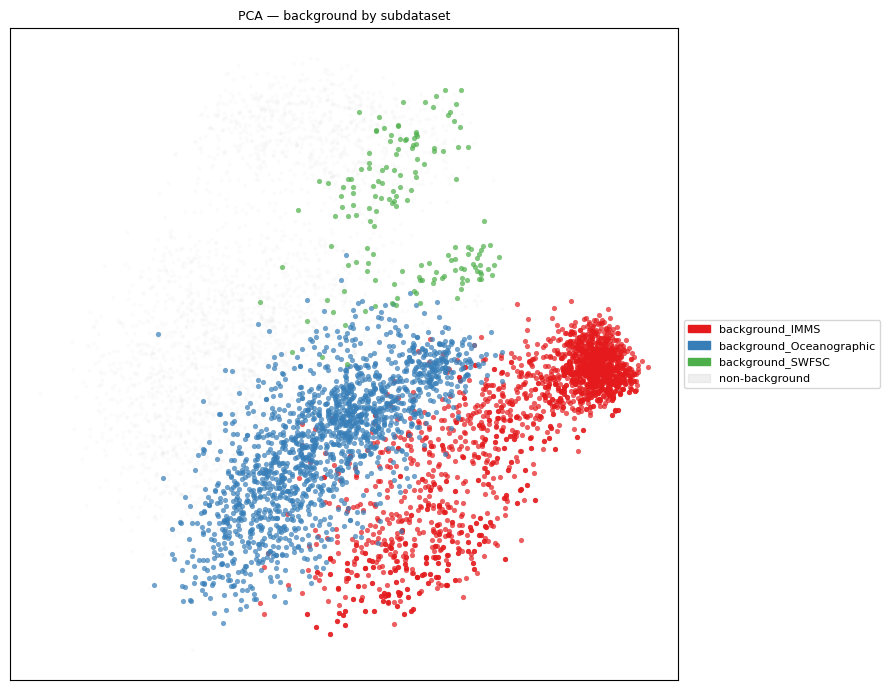

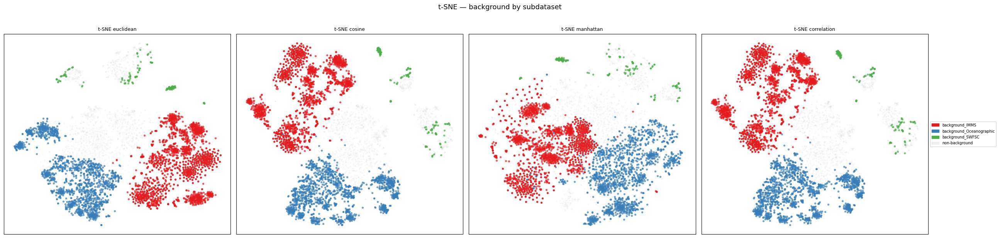

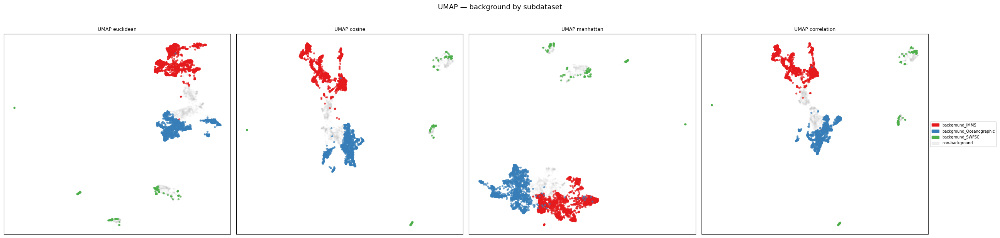

In [11]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

# ── Load ──────────────────────────────────────────────────────────────
metrics  = ['euclidean', 'cosine', 'manhattan', 'correlation']
X_pca2   = np.load(f'{save_dir}/dim_red/coords_pca2_binary.npy')
tsne     = {m: np.load(f'{save_dir}/dim_red/coords_tsne_{m}_binary.npy') for m in metrics}
umap_c   = {m: np.load(f'{save_dir}/dim_red/coords_umap_{m}_binary.npy') for m in metrics}

# ── Build per-point background sublabel ──────────────────────────────
labels = np.where(
    metadata_clean['label'] == 'background',
    'background_' + metadata_clean['subdataset'],
    metadata_clean['label']
)

# ── Palette ───────────────────────────────────────────────────────────
bg_classes = sorted(set(l for l in labels if l.startswith('background_')))
cmap       = plt.cm.Set1
bg_colors  = {cls: cmap(i) for i, cls in enumerate(bg_classes)}
NON_BG     = '#CCCCCC'

legend_patches = [mpatches.Patch(color=v, label=k) for k, v in bg_colors.items()]
legend_patches += [mpatches.Patch(color=NON_BG, alpha=0.3, label='non-background')]

def plot_bg(ax, coords, labels, title):
    labels = np.asarray(labels)
    m_non = np.array([l not in bg_colors for l in labels])
    ax.scatter(coords[m_non, 0], coords[m_non, 1],
               c=NON_BG, alpha=0.08, s=8, linewidths=0)
    for cls, col in bg_colors.items():
        m = labels == cls
        if m.sum() == 0: continue
        ax.scatter(coords[m, 0], coords[m, 1],
                   c=[col], alpha=0.7, s=14, linewidths=0,
                   label=f'{cls} (n={m.sum()})')
    ax.set_title(title, fontsize=9)
    ax.set_xticks([]); ax.set_yticks([])

# ── PCA ───────────────────────────────────────────────────────────────
fig, ax = plt.subplots(figsize=(9, 7))
plot_bg(ax, X_pca2, labels, 'PCA — background by subdataset')
ax.legend(handles=legend_patches, fontsize=8, loc='center left', bbox_to_anchor=(1, 0.5))
plt.tight_layout()
plt.savefig(f'{save_dir}/dim_red/bg_subdataset_pca.png', dpi=150, bbox_inches='tight')
plt.show()

# ── t-SNE grid ────────────────────────────────────────────────────────
fig, axes = plt.subplots(1, 4, figsize=(26, 6))
for ax, m in zip(axes, metrics):
    plot_bg(ax, tsne[m], labels, f't-SNE {m}')
axes[-1].legend(handles=legend_patches, fontsize=7, loc='center left', bbox_to_anchor=(1, 0.5))
plt.suptitle('t-SNE — background by subdataset', fontsize=13, y=1.02)
plt.tight_layout()
plt.savefig(f'{save_dir}/dim_red/bg_subdataset_tsne.png', dpi=150, bbox_inches='tight')
plt.show()

# ── UMAP grid ─────────────────────────────────────────────────────────
fig, axes = plt.subplots(1, 4, figsize=(26, 6))
for ax, m in zip(axes, metrics):
    plot_bg(ax, umap_c[m], labels, f'UMAP {m}')
axes[-1].legend(handles=legend_patches, fontsize=7, loc='center left', bbox_to_anchor=(1, 0.5))
plt.suptitle('UMAP — background by subdataset', fontsize=13, y=1.02)
plt.tight_layout()
plt.savefig(f'{save_dir}/dim_red/bg_subdataset_umap.png', dpi=150, bbox_inches='tight')
plt.show()

In [4]:
# ── Signal count per window — 9 projections, thesis plotly style ─────────────
import os
import numpy as np
import pandas as pd
import plotly.graph_objects as go
from plotly.subplots import make_subplots

GREY, FONT = "#5a5a5a", "Helvetica Neue, Arial, sans-serif"
save_dir = '/data2/mromaniuc/cet-det/models/perch_v2/DRYAD'
C_BG     = "#F0EDE6"


# 1. Load coords from disk (saved with the _binary suffix)
metrics = ['euclidean', 'cosine', 'manhattan', 'correlation']
projections = {'PCA': np.load(f'{save_dir}/dim_red/coords_pca2_binary.npy')}
for m in metrics:
    projections[f't-SNE {m}'] = np.load(f'{save_dir}/dim_red/coords_tsne_{m}_binary.npy')
for m in metrics:
    projections[f'UMAP {m}']  = np.load(f'{save_dir}/dim_red/coords_umap_{m}_binary.npy')

# 2. Signal count from metadata.csv (row-aligned to coords)
meta = pd.read_csv(f'{save_dir}/embeddings/metadata.csv')
n_rows = projections['PCA'].shape[0]
assert len(meta) == n_rows, f"metadata ({len(meta)}) != coords ({n_rows}) — not aligned!"
signal_count = (meta['n_whistle'].values + meta['n_bout'].values).astype(float)

vmax = max(float(np.percentile(signal_count, 95)), 1.0)   # cap at 95th pct

# Thesis-warm sequential scale: low = light, high = activity (amber → coral)
THESIS_HEAT = [[0.0, "#a3cfcf"], [0.5, "#2f9292"], [1.0, "#185FA5"]]
# 3. Build 3×3 grid with one shared colorbar (coloraxis)
items = list(projections.items())
fig = make_subplots(rows=3, cols=3, subplot_titles=[n for n, _ in items],
                    horizontal_spacing=0.04, vertical_spacing=0.08)

for idx, (name, coords) in enumerate(items):
    r, col = idx // 3 + 1, idx % 3 + 1
    method = name.split()[0]

    fig.add_trace(
        go.Scattergl(
            x=coords[:, 0], y=coords[:, 1],
            mode='markers',
            marker=dict(
                size=3, color=signal_count, coloraxis='coloraxis',
                opacity=0.7, line=dict(width=0)),
            showlegend=False,
            hoverinfo='skip'),
        row=r, col=col)

    fig.update_xaxes(
        title=dict(text=f"{method} 1", font=dict(size=10, color=GREY)),
        showticklabels=True, tickfont=dict(size=8, color=GREY),
        showgrid=True, gridcolor="#e3e3e3", gridwidth=0.5,
        zeroline=False, linecolor="#e3e3e3", row=r, col=col)
    fig.update_yaxes(
        title=dict(text=f"{method} 2", font=dict(size=10, color=GREY)),
        showticklabels=True, tickfont=dict(size=8, color=GREY),
        showgrid=True, gridcolor="#e3e3e3", gridwidth=0.5,
        zeroline=False, linecolor="#e3e3e3", row=r, col=col)

fig.update_layout(
    template='plotly_white', width=1120, height=1020,
    paper_bgcolor='white', plot_bgcolor='white',
    font=dict(family=FONT, size=12, color=GREY),
    title=dict(text="SIGNAL COUNT (EMBEDDINGS) — whistles + bouts, capped at 95th pct",
               x=0.01, xanchor='left', y=0.985, font=dict(size=13, color=GREY)),
    margin=dict(l=50, r=120, t=70, b=40),
    coloraxis=dict(
        colorscale=THESIS_HEAT, cmin=0, cmax=vmax,
        colorbar=dict(
            title=dict(text="signal count", side="right",
                       font=dict(size=11, color=GREY)),
            thickness=14, len=0.55, x=1.015, xanchor='left',
            y=0.5, yanchor='middle', tickfont=dict(size=10, color=GREY),
            outlinewidth=0),
    ),
)
for ann in fig.layout.annotations:           # restyle subplot titles
    ann.font = dict(size=11, color=GREY, family=FONT)

fig.show()

# 4. Save — PNG if Chrome/kaleido available, else fall back to interactive HTML
out = f'{save_dir}/dim_red/coloring_signal_count_plotly'
try:
    fig.write_image(f'{out}.png', scale=3)
    print('Saved:', f'{out}.png')
except Exception as e:
    fig.write_html(f'{out}.html')
    print(f'PNG export failed ({type(e).__name__}); saved HTML instead: {out}.html')

PNG export failed (RuntimeError); saved HTML instead: /data2/mromaniuc/cet-det/models/perch_v2/DRYAD/dim_red/coloring_signal_count_plotly.html
